# Import Modules

In [1]:
import scanpy as sc
import squidpy as sq
import sys
sys.path.append(r"/home/yqzhou/JUPYTER/MyPackage/Pianno")
import pianno as po
import json
from os.path import join
import matplotlib.pyplot as plt
import matplotlib as mpl

# Data input

In [2]:
# Setting the data and configuration file storage path.
sample_name = "GT151671"
config_path = "/home/yqzhou/JUPYTER/Revision/Tutorials/" + sample_name
adata = sc.read(join(config_path, "pianno_adata.h5ad"))

# (Optional) Step1：Automatic hyper-parameter selection

In [3]:
# Specify a known marker gene for each pattern
Patterndict = dict(L1 = ['CXCL14'],
                   L2 = ['HPCAL1'],
                   L3 = ['HOPX'],
                   L4 = ['NEFH'],
                   L5 = ['PCP4'],
                   L6 = ['SYNPR'],
                   WM = ['MBP'])

Configuration path of Pianno: /home/yqzhou/JUPYTER/Revision/Tutorials/GT151671
[2024-01-16 22:34:49] Creating experiment, Experiment ID: eg96xhl4
[2024-01-16 22:34:49] Starting web server...
[2024-01-16 22:34:50] Setting up...
[2024-01-16 22:34:50] Web UI URLs: http://127.0.0.1:8080 http://10.10.10.4:8080 http://11.11.11.4:8080
[2024-01-16 22:45:01] Stopping experiment, please wait...
[2024-01-16 22:45:04] Experiment stopped


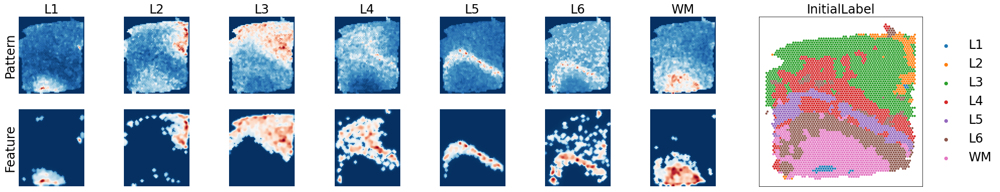

In [4]:
# If the connection fails, try a few more times.
# Open the Web UI URLs to visualize the hyperparameter tuning process.
# The default experiment lasts for a maximum of 10 minutes, 
# which can be modified according to the actual situation.
adata = po.AutoPatternRecognition(adata,
                                  Patterndict=Patterndict,
                                  config_path=config_path,
                                  param_tuning=True,
                                  max_experiment_duration='10m')

In [5]:
# Print the optimal parameters saved in the previous step.
with open(join(config_path, "best_params.json"),'r') as f:
    best_params_dict = json.load(f)
for key in best_params_dict:
    best_params = best_params_dict[key]  
best_params

{'n_class': 3,
 'dilation_radius': 1.0,
 'denoise_weight': 0.02,
 'unsharp_radius': 2.0,
 'unsharp_amount': 1.0,
 'gaussian_blur': 1.0}

# (Optional) Step2：Marker Selection

In [6]:
# Take the top 10 DEGs as candidate marker genes to make a proposed patterndict
Patterndict = po.ProposedPatterndict(adata, top_n=10)

L1
['CXCL14', 'IFI27', 'RPL35A', 'B2M', 'CD24', 'HSPB1', 'IGFBP4', 'RPS14', 'IFITM3', 'RPL30']


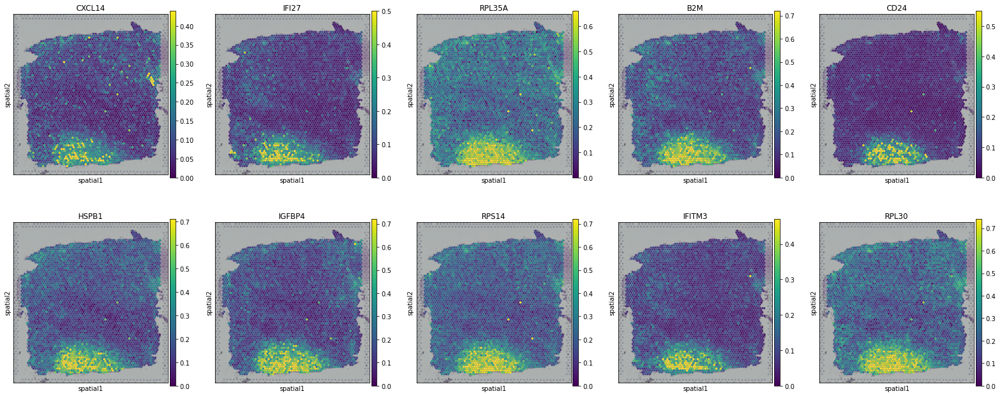

L2
['CARTPT', 'SAA1', 'ADH1B', 'FABP4', 'MALAT1', 'CD36', 'SAA2', 'G0S2', 'PLIN1', 'HPCAL1']


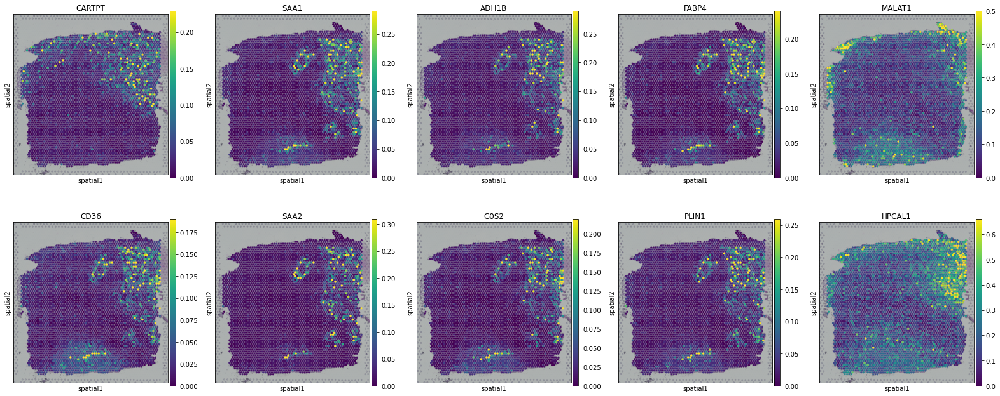

L3
['THRSP', 'HOPX', 'FABP4', 'CARTPT', 'ADH1B', 'PCDH8']


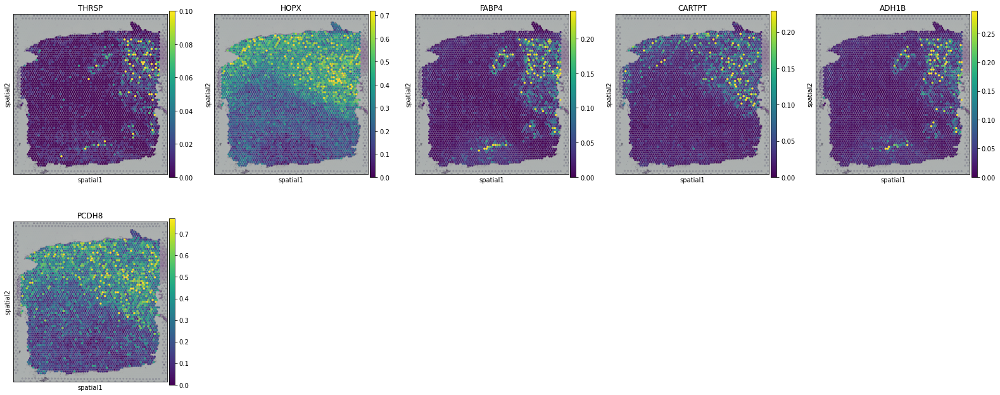

L4
['CPB1']


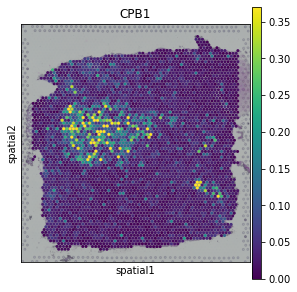

L5
['IGHG3', 'PCP4', 'TMSB10', 'DRD5', 'TRABD2A', 'RPRM', 'AL353751.1']


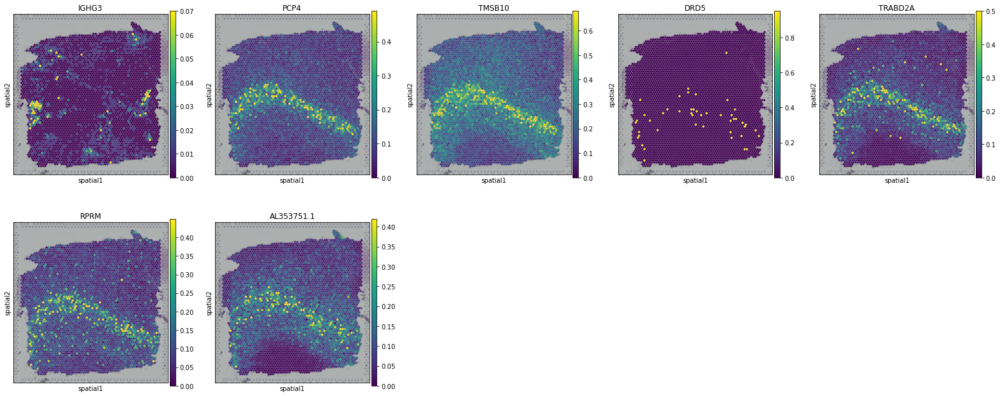

L6
['THEMIS', 'DRD5', 'SMIM32', 'HBB', 'NR4A2', 'HBA2']


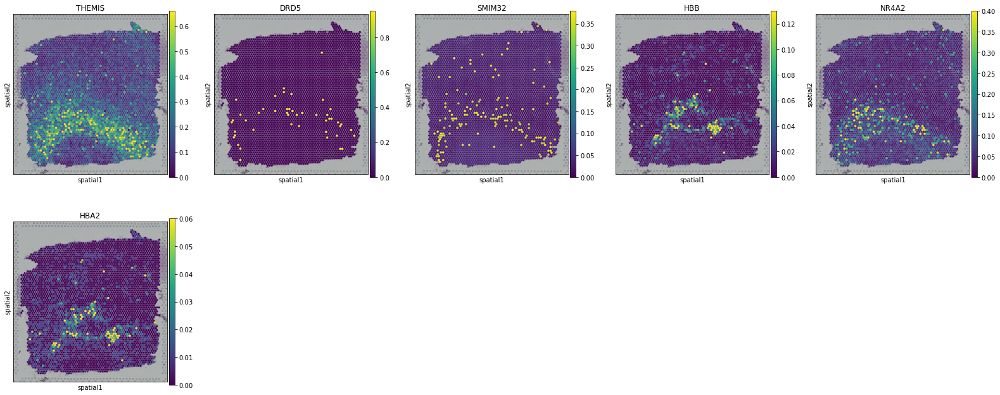

WM
['MBP', 'GFAP', 'BCAS1', 'SPP1', 'SELENOP', 'CD9', 'NDRG1', 'PLP1', 'MOBP', 'PMP22']


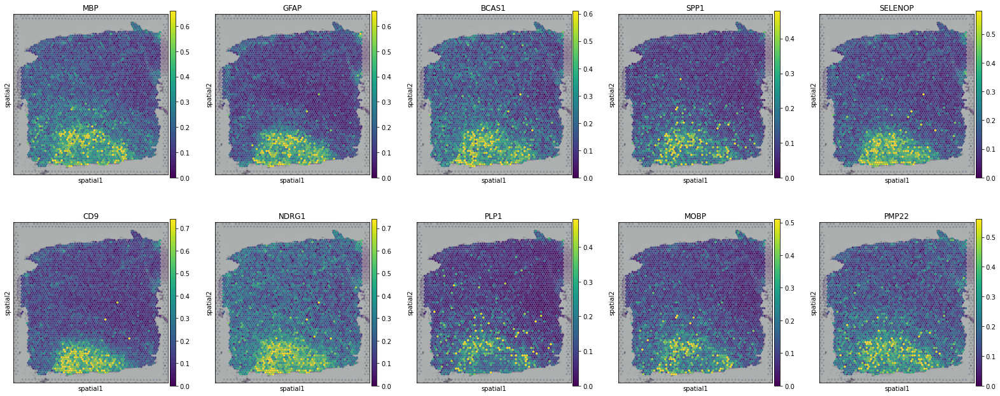

In [7]:
# Visualization of candidate marker genes
for k, v in Patterndict.items():
    print(k)
    print(v)
    with mpl.rc_context({'axes.facecolor':  'black',
                         'figure.figsize': [4.5, 5]}):
        sc.pl.spatial(adata, #cmap='magma',
                      layer='DenoisedX',
                      color=v,
                      ncols=5, size=5,
                      spot_size=25,
                      vmin=0, vmax='p99'
                     )

# Step3：Initial Pattern Recognition

In [8]:
# Construct the marker list by selecting 1-3 genes for each pattern 
# from the above candidate marker genes.
Patterndict = dict(L1 = ['CXCL14'],
                   L2 = ['HPCAL1','KCNIP2'],
                   L3 = ['HOPX','CARTPT','SNCG'],
                   L4 = ['PVALB'],
                   L5 = ['PCP4','TMSB10'],
                   L6 = ['SYNPR','THEMIS'],
                   WM = ['H3F3B','NDRG1'])

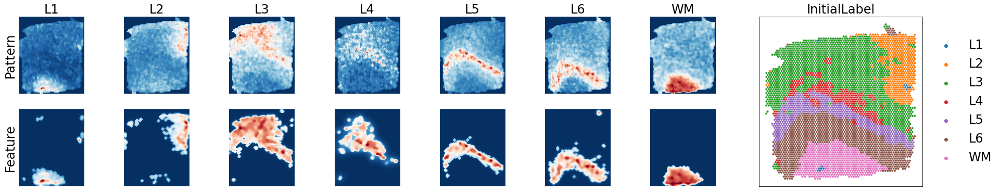

In [9]:
adata = po.AutoPatternRecognition(adata,
                                  Patterndict=Patterndict,
                                  config_path=config_path,
                                  param_tuning=False)

# Step4：Annotation Improvement

---Create Spatial Graph: Done!
---Compute Spatial Energy: Done!
---Find K-Nearest Neighbor in UMAP: Done!
---Compute KNN Energy: Done!
---Compute Global Energy: Done!


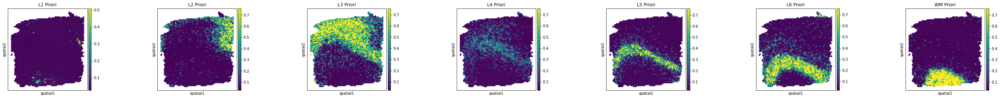

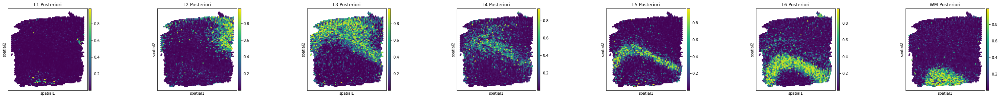

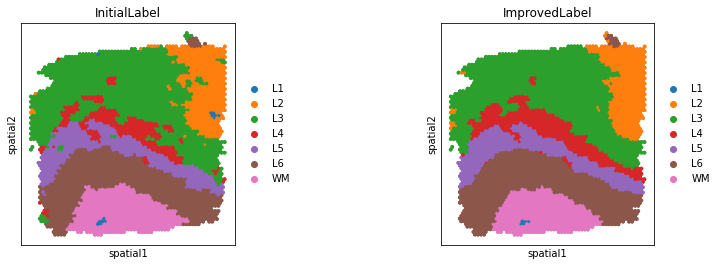

In [10]:
adata = po.AnnotationImprovement(adata)